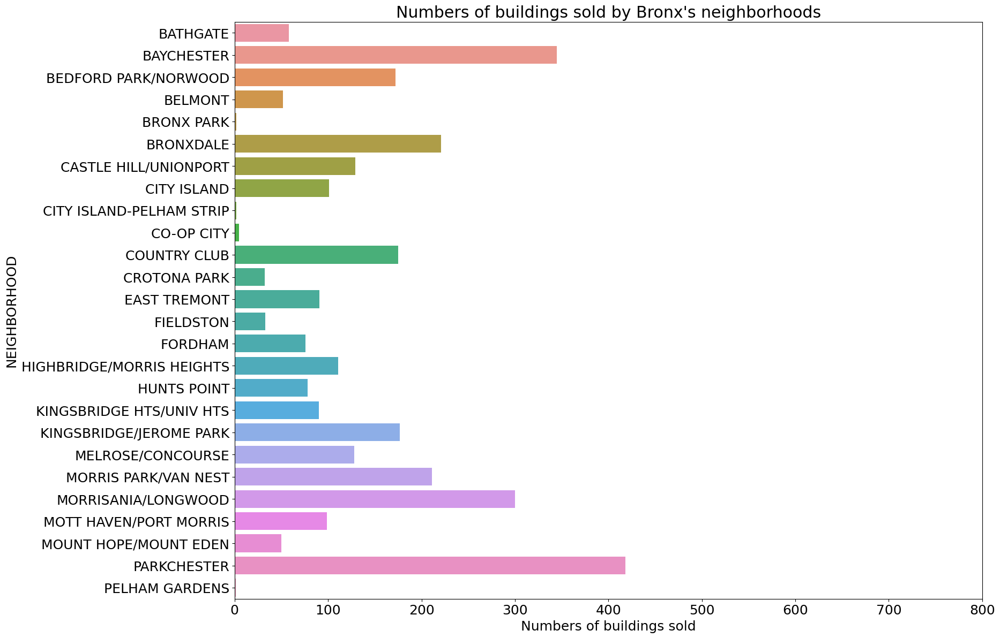

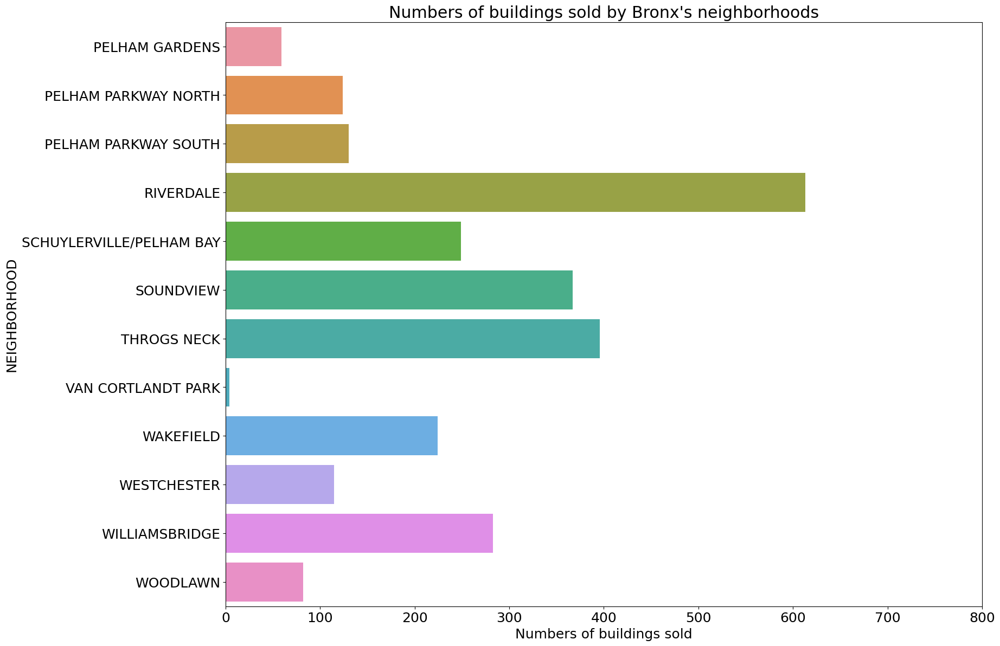

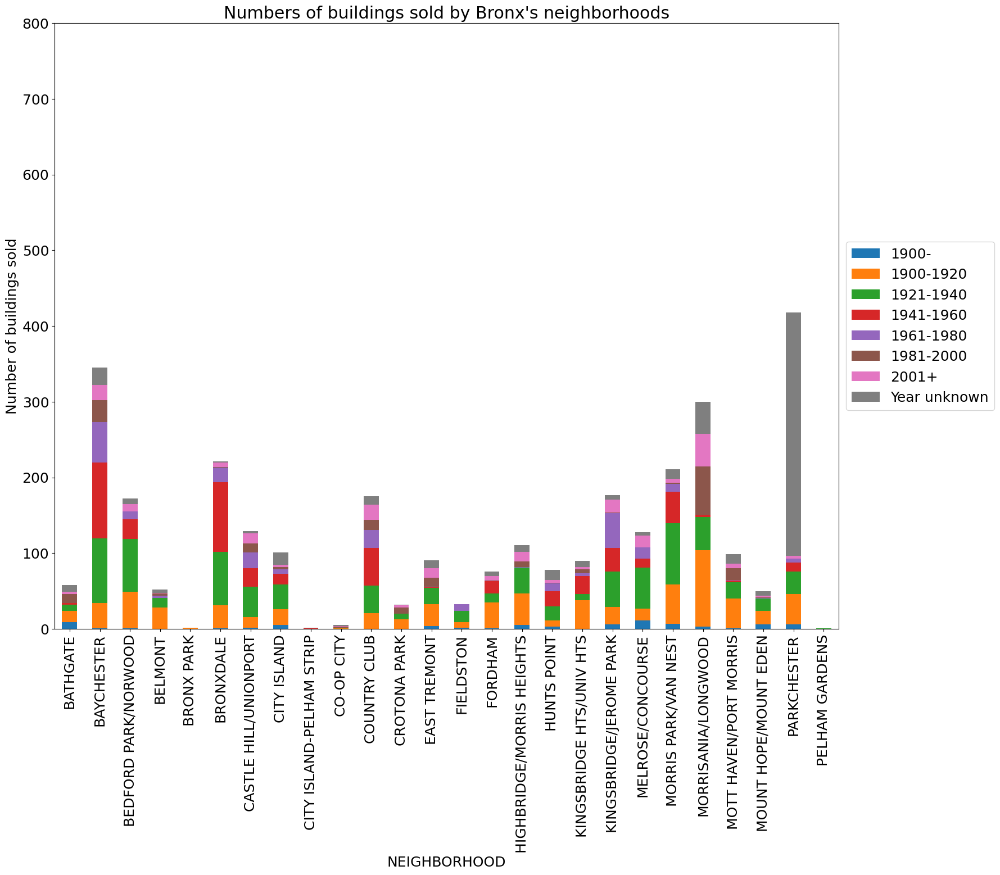

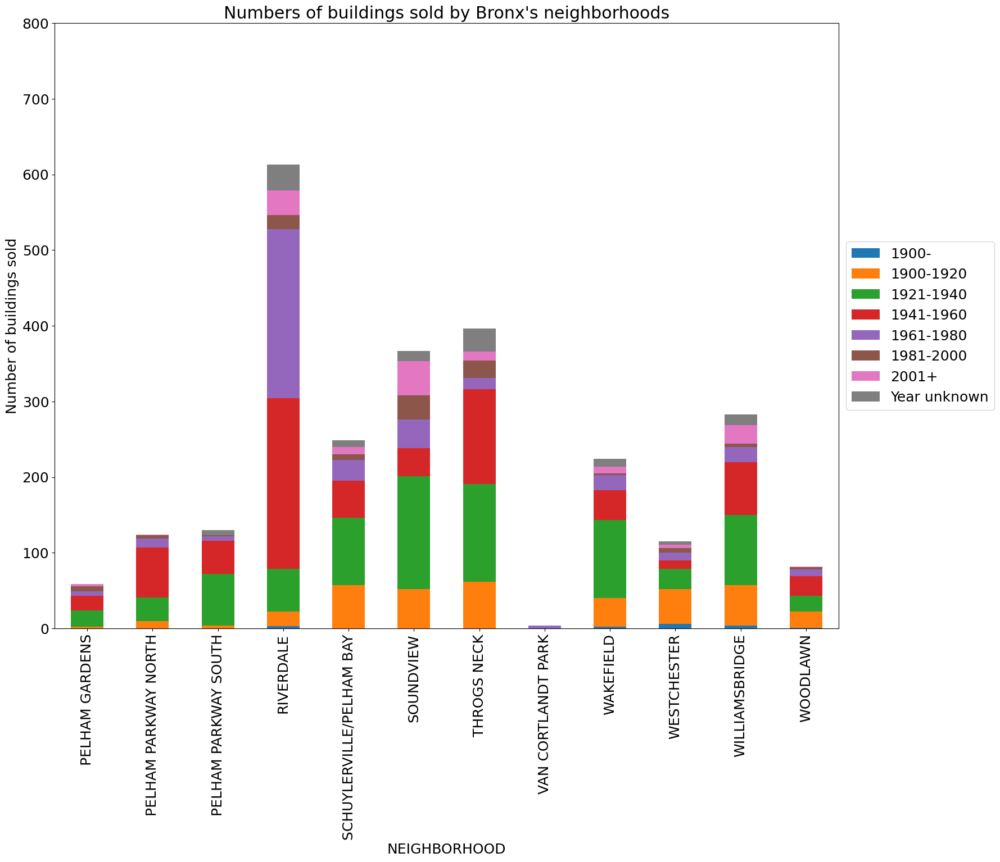

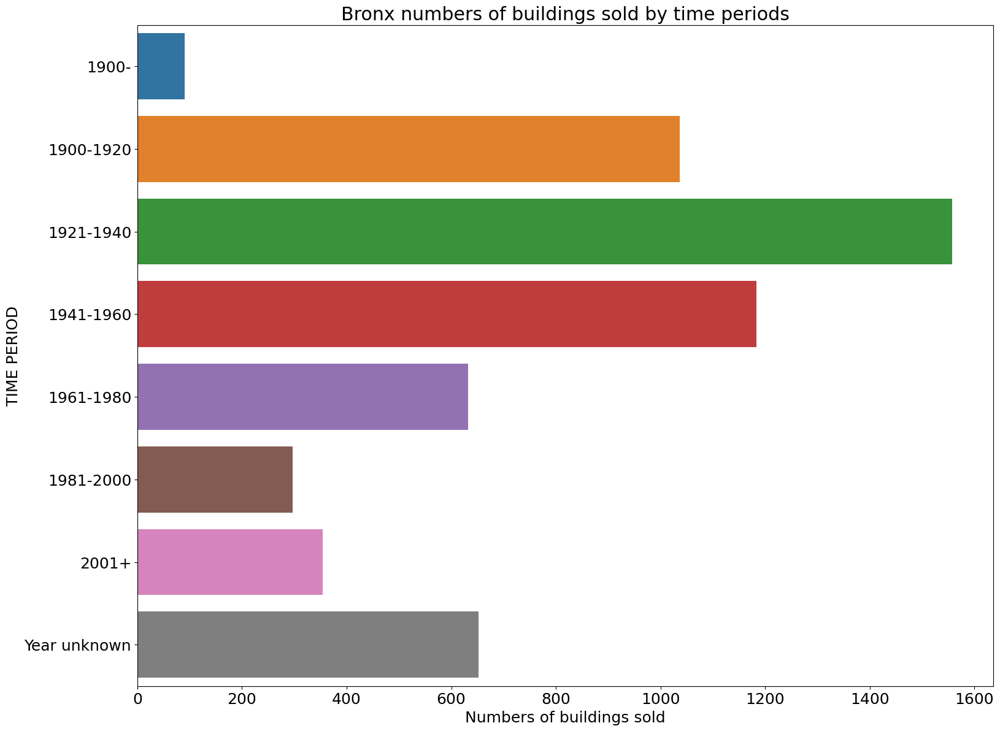

...

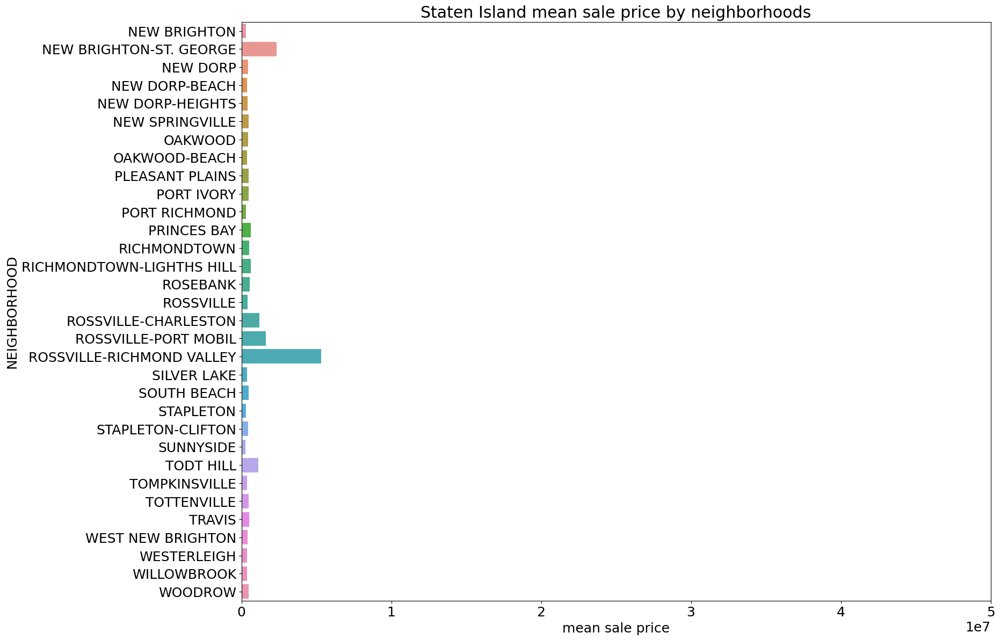

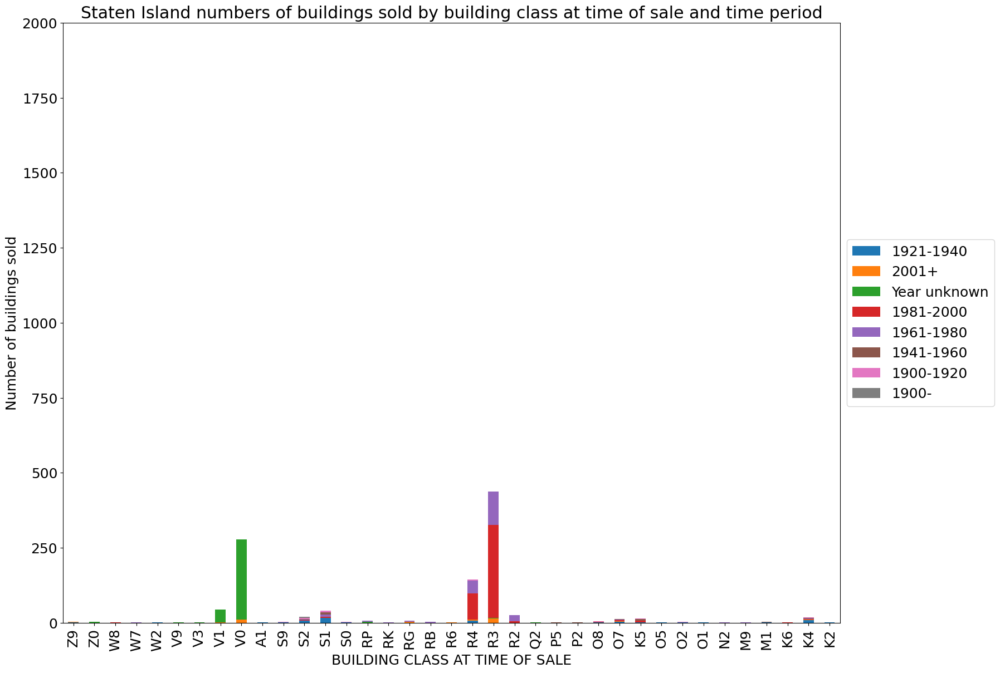

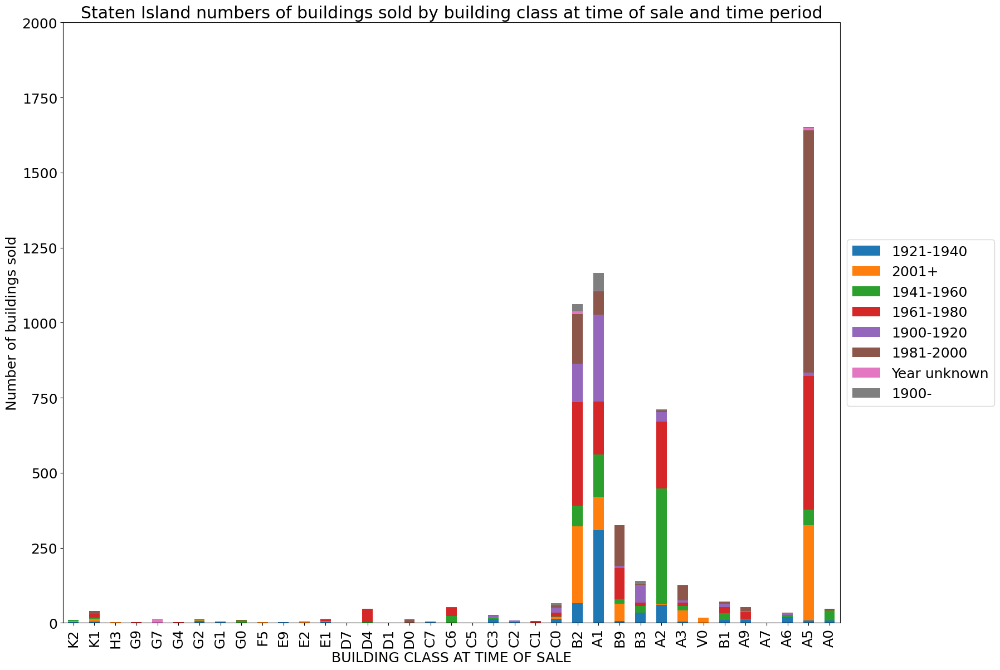

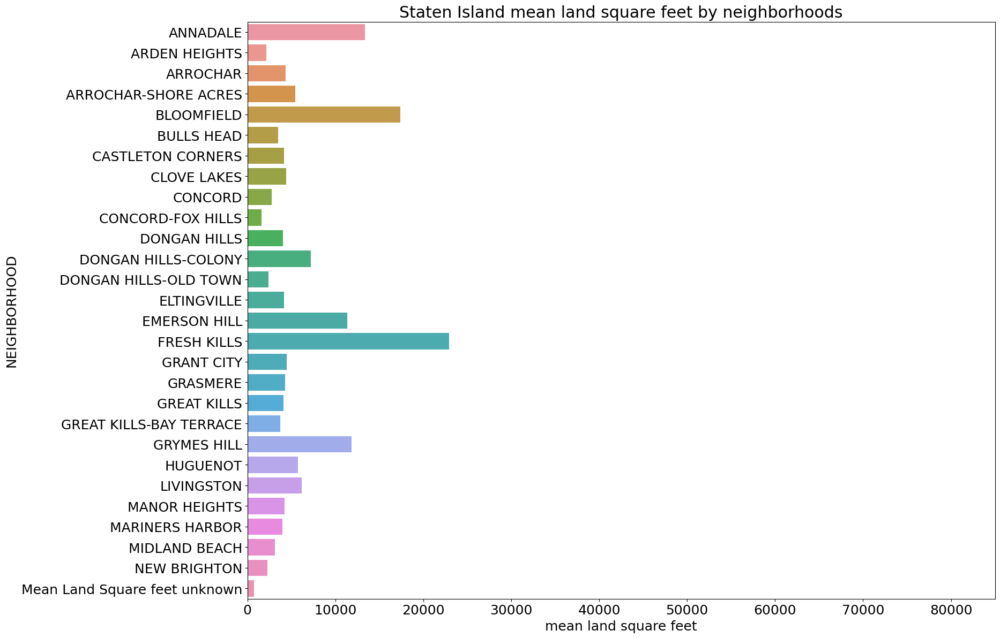

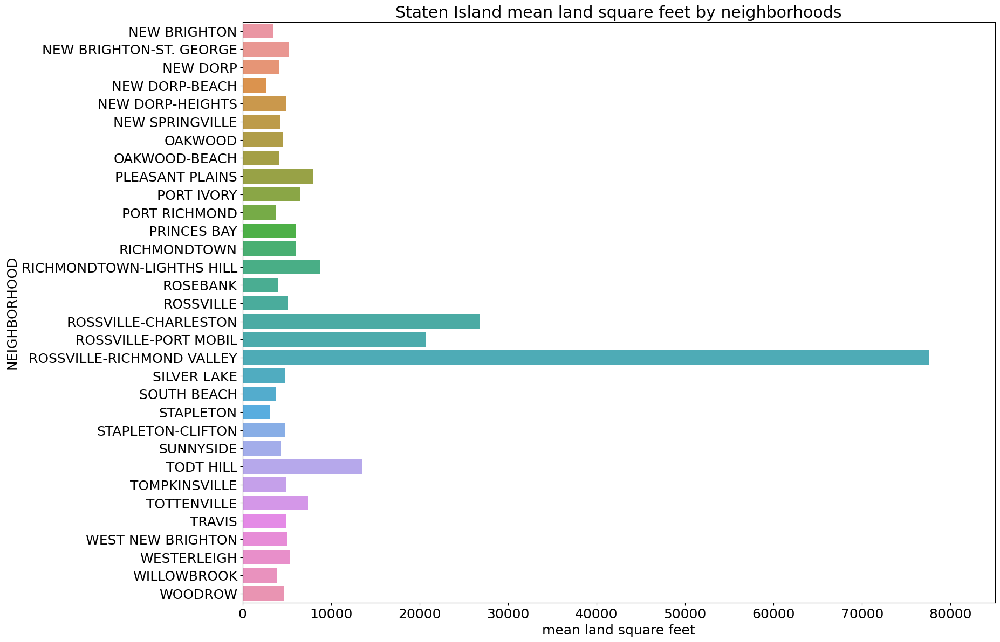

In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns

import warnings
warnings.filterwarnings("ignore", "is_categorical_dtype")
warnings.filterwarnings("ignore", "use_inf_as_na")
warnings.simplefilter(action='ignore', category=FutureWarning)
pd.options.mode.chained_assignment = None

mpl.rcParams["font.size"] = 18
mpl.rcParams['figure.figsize'] = [18,14]

df = pd.concat(
   map(pd.read_excel, ['rollingsales_bronx.xlsx', 'rollingsales_brooklyn.xlsx',
                      'rollingsales_manhattan.xlsx','rollingsales_queens.xlsx',
                      'rollingsales_statenisland.xlsx']), ignore_index=True )

df.loc[df["EASEMENT"].isnull(), "EASEMENT"] = "Doesn't have an easement"
df.loc[df["EASEMENT"]=='', "EASEMENT"] = "Doesn't have an easement"
df.loc[df["EASEMENT"]==0, "EASEMENT"] = "Doesn't have an easement"
df.loc[df["APARTMENT NUMBER"].isnull(), "APARTMENT NUMBER"] = "Not an apartment"
df.loc[df["APARTMENT NUMBER"]=='', "APARTMENT NUMBER"] = "Not an apartment"
df.loc[df["APARTMENT NUMBER"]==0, "APARTMENT NUMBER"] = "Not an apartment"
df.loc[df["RESIDENTIAL UNITS"].isnull(), "RESIDENTIAL UNITS"] = "Doesn't have residential units"
df.loc[df["RESIDENTIAL UNITS"]=='', "RESIDENTIAL UNITS"] = "Doesn't have residential units"
df.loc[df["RESIDENTIAL UNITS"]==0, "RESIDENTIAL UNITS"] = "Doesn't have residential units"
df.loc[df["COMMERCIAL UNITS"].isnull(), "COMMERCIAL UNITS"] = "Doesn't have commercial units"
df.loc[df["COMMERCIAL UNITS"]=='', "COMMERCIAL UNITS"] = "Doesn't have commercial units"
df.loc[df["COMMERCIAL UNITS"]==0, "COMMERCIAL UNITS"] = "Doesn't have commercial units"
df.loc[df["TOTAL UNITS"].isnull(), "TOTAL UNITS"] = "Doesn't have total units"
df.loc[df["TOTAL UNITS"]=='', "TOTAL UNITS"] = "Doesn't have total units"
df.loc[df["TOTAL UNITS"]==0, "TOTAL UNITS"] = "Doesn't have total units"
df.loc[df["LAND SQUARE FEET"].isnull(), "LAND SQUARE FEET"] = "Land square feet is unknown"
df.loc[df["LAND SQUARE FEET"]=='', "LAND SQUARE FEET"] = "Land square feet is unknown"
df.loc[df["LAND SQUARE FEET"]==0, "LAND SQUARE FEET"] = "Land square feet is unknown"
df.loc[df["GROSS SQUARE FEET"].isnull(), "GROSS SQUARE FEET"] = "Gross square feet is unknown"
df.loc[df["GROSS SQUARE FEET"]=='', "GROSS SQUARE FEET"] = "Gross square feet is unknown"
df.loc[df["GROSS SQUARE FEET"]==0, "GROSS SQUARE FEET"] = "Gross square feet is unknown"
df.loc[df["BUILDING CLASS AT PRESENT"].isnull(), "BUILDING CLASS AT PRESENT"] = "Building class is unknown"
df.loc[df["BUILDING CLASS AT PRESENT"]=='', "BUILDING CLASS AT PRESENT"] = "Building class is unknown"
df.loc[df["BUILDING CLASS AT PRESENT"]==0, "BUILDING CLASS AT PRESENT"] = "Building class is unknown"
df.loc[df["BOROUGH"] == 2, "BOROUGH"] = "Bronx"
df.loc[df["BOROUGH"] == 4, "BOROUGH"] = "Queens"
df.loc[df["BOROUGH"] == 3, "BOROUGH"] = "Brooklyn"
df.loc[df["BOROUGH"] == 1, "BOROUGH"] = "Manhattan"
df.loc[df["BOROUGH"] == 5, "BOROUGH"] = "Staten Island"

df.loc[df["YEAR BUILT"].isnull(), "YEAR BUILT"] = '111111'
df.loc[df["YEAR BUILT"]=='', "YEAR BUILT"] = '111111'
df.loc[df["YEAR BUILT"]=='YEAR BUILT', "YEAR BUILT"] = '111111'
df['YEAR BUILT'] = df['YEAR BUILT'].map(int)
# create a list of our conditions
conditions = [
    (df['YEAR BUILT'] == 111111),
    (df['YEAR BUILT'] < 1900),
    (df['YEAR BUILT'] >= 1900) & (df['YEAR BUILT'] <= 1920),
    (df['YEAR BUILT'] >= 1921) & (df['YEAR BUILT'] <= 1940),
    (df['YEAR BUILT'] >= 1941) & (df['YEAR BUILT'] <= 1960),
    (df['YEAR BUILT'] >= 1961) & (df['YEAR BUILT'] <= 1980),
    (df['YEAR BUILT'] >= 1981) & (df['YEAR BUILT'] <= 2000),
    (df['YEAR BUILT'] >= 2001)
    ]
# create a list of the values we want to assign for each condition
values = ['Year unknown', '1900-', '1900-1920', '1921-1940', '1941-1960', '1961-1980', '1981-2000', '2001+']

# create a new column and use np.select to assign values to it using our lists as arguments
df['TIME PERIOD'] = np.select(conditions, values)
#bronx
dfBronx = df.loc[df["BOROUGH"]=='Bronx']
dfBronxFirstHalf = dfBronx.head(3157).reset_index()
dfBronxSecondHalf = dfBronx.tail(len(dfBronx) - 3157).reset_index()
dfBronxNeighborhoodsSize = dfBronxFirstHalf.groupby('NEIGHBORHOOD').size().reset_index(name = 'Numbers of buildings sold')
dfBronxNeighborhoodsSize =  sns.barplot(x='Numbers of buildings sold', y= 'NEIGHBORHOOD', data=dfBronxNeighborhoodsSize)
dfBronxNeighborhoodsSize.set_xlim(0, 800)
dfBronxNeighborhoodsSize.set(title = 'Numbers of buildings sold by Bronx\'s neighborhoods')
plt.show()
dfBronxNeighborhoodsSize = dfBronxSecondHalf.groupby('NEIGHBORHOOD').size().reset_index(name = 'Numbers of buildings sold')
dfBronxNeighborhoodsSize =  sns.barplot(x='Numbers of buildings sold', y= 'NEIGHBORHOOD', data=dfBronxNeighborhoodsSize)
dfBronxNeighborhoodsSize.set_xlim(0, 800)
dfBronxNeighborhoodsSize.set(title = 'Numbers of buildings sold by Bronx\'s neighborhoods')
plt.show()

dfBronxNeighborhoodsSizeByTimePeriod = dfBronxFirstHalf.groupby(['NEIGHBORHOOD', 'TIME PERIOD']).size().unstack().plot(kind='bar', stacked=True)
dfBronxNeighborhoodsSizeByTimePeriod.set(title = 'Numbers of buildings sold by Bronx\'s neighborhoods')
plt.ylabel('Number of buildings sold')
dfBronxNeighborhoodsSizeByTimePeriod.set_ylim(0, 800)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.show()
dfBronxNeighborhoodsSizeByTimePeriod = dfBronxSecondHalf.groupby(['NEIGHBORHOOD', 'TIME PERIOD']).size().unstack().plot(kind='bar', stacked=True)
dfBronxNeighborhoodsSizeByTimePeriod.set(title = 'Numbers of buildings sold by Bronx\'s neighborhoods')
dfBronxNeighborhoodsSizeByTimePeriod.set_ylim(0, 800)
plt.ylabel('Number of buildings sold')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.show()

dfBronxNeighborhoodsTimePeriod = dfBronx.groupby('TIME PERIOD')['NEIGHBORHOOD'].size().reset_index(name = 'Numbers of buildings sold')
dfBronxNeighborhoodsTimePeriod =  sns.barplot(x='Numbers of buildings sold', y= 'TIME PERIOD', data=dfBronxNeighborhoodsTimePeriod)
dfBronxNeighborhoodsTimePeriod.set(title = 'Bronx numbers of buildings sold by time periods')

plt.show()

dfBronxNeighborhoodsMaxSalePrice = dfBronxFirstHalf.groupby('NEIGHBORHOOD')['SALE PRICE'].max().reset_index(name = 'Max sale price')
dfBronxNeighborhoodsMaxSalePrice =  sns.barplot(x='Max sale price', y= 'NEIGHBORHOOD', data=dfBronxNeighborhoodsMaxSalePrice)
dfBronxNeighborhoodsMaxSalePrice.set(title = 'Bronx max sale price by neighborhoods')
dfBronxNeighborhoodsMaxSalePrice.set_xlim(0, 500000000)
plt.show()
dfBronxNeighborhoodsMaxSalePrice = dfBronxSecondHalf.groupby('NEIGHBORHOOD')['SALE PRICE'].max().reset_index(name = 'Max sale price')
dfBronxNeighborhoodsMaxSalePrice =  sns.barplot(x='Max sale price', y= 'NEIGHBORHOOD', data=dfBronxNeighborhoodsMaxSalePrice)
dfBronxNeighborhoodsMaxSalePrice.set(title = 'Bronx max sale price by neighborhoods')
dfBronxNeighborhoodsMaxSalePrice.set_xlim(0, 500000000)
plt.show()

dfBronxNeighborhoodsMeanSalePrice = dfBronxFirstHalf.groupby('NEIGHBORHOOD')['SALE PRICE'].mean().reset_index(name = 'mean sale price')
dfBronxNeighborhoodsMeanSalePrice =  sns.barplot(x='mean sale price', y= 'NEIGHBORHOOD', data=dfBronxNeighborhoodsMeanSalePrice)
dfBronxNeighborhoodsMeanSalePrice.set(title = 'Bronx mean sale price by neighborhoods')
dfBronxNeighborhoodsMeanSalePrice.set_xlim(0, 5000000)
plt.show()
dfBronxNeighborhoodsMeanSalePrice = dfBronxSecondHalf.groupby('NEIGHBORHOOD')['SALE PRICE'].mean().reset_index(name = 'mean sale price')
dfBronxNeighborhoodsMeanSalePrice =  sns.barplot(x='mean sale price', y= 'NEIGHBORHOOD', data=dfBronxNeighborhoodsMeanSalePrice)
dfBronxNeighborhoodsMeanSalePrice.set(title = 'Bronx mean sale price by neighborhoods')
dfBronxNeighborhoodsMeanSalePrice.set_xlim(0, 5000000)
plt.show()

dfBronxSorted = dfBronx.sort_values(by = ['BUILDING CLASS AT PRESENT'], ascending=False)
dfBronxSortedFirstHalf = dfBronxSorted.head(966).reset_index()
dfBronxSortedSecondHalf = dfBronxSorted.tail(len(dfBronxSorted.index) - 966).reset_index()
dfBronxNeighborhoodsSizeByTimePeriod = dfBronxSortedFirstHalf.groupby(['BUILDING CLASS AT TIME OF SALE', 'TIME PERIOD'], sort = False).size().unstack().plot(kind='bar', stacked=True)
dfBronxNeighborhoodsSizeByTimePeriod.set(title = 'Bronx numbers of buildings sold by building class at time of sale and time period')
dfBronxNeighborhoodsSizeByTimePeriod.set_ylim(0, 1000)
plt.ylabel('Number of buildings sold')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.show()
dfBronxNeighborhoodsSizeByTimePeriod = dfBronxSortedSecondHalf.groupby(['BUILDING CLASS AT TIME OF SALE', 'TIME PERIOD'], sort = False).size().unstack().plot(kind='bar', stacked=True)
dfBronxNeighborhoodsSizeByTimePeriod.set(title = 'Bronx numbers of buildings sold by building class at time of sale and time period')
dfBronxNeighborhoodsSizeByTimePeriod.set_ylim(0, 1000)
plt.ylabel('Number of buildings sold')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.show()

indexLandSquareFeetWholeArray = dfBronx[ (dfBronx['LAND SQUARE FEET']=='Land square feet is unknown')].index
indexLandSquareFeet = dfBronxFirstHalf[ (dfBronxFirstHalf['LAND SQUARE FEET']=='Land square feet is unknown')].index
dfBronxFirstHalf.drop(indexLandSquareFeet , inplace=True)
dfBronxNeighborhoodsMeanSalePrice = dfBronxFirstHalf.groupby('NEIGHBORHOOD')['LAND SQUARE FEET'].mean().reset_index(name = 'mean land square feet')
new_row = pd.DataFrame({'NEIGHBORHOOD': ['Mean Land Square feet unknown'], 'mean land square feet': [len(indexLandSquareFeetWholeArray)]})
dfBronxNeighborhoodsMeanSalePrice = pd.concat([dfBronxNeighborhoodsMeanSalePrice, new_row], ignore_index=True)
dfBronxNeighborhoodsMeanSalePrice =  sns.barplot(x='mean land square feet', y= 'NEIGHBORHOOD', data=dfBronxNeighborhoodsMeanSalePrice)
dfBronxNeighborhoodsMeanSalePrice.set(title = 'Bronx mean land square feet by neighborhoods')
dfBronxNeighborhoodsMeanSalePrice.set_xlim(0, 500000)
plt.show()
indexLandSquareFeet = dfBronxSecondHalf[ (dfBronxSecondHalf['LAND SQUARE FEET']=='Land square feet is unknown')].index
dfBronxDropped = dfBronxSecondHalf.drop(indexLandSquareFeet , inplace=True)
dfBronxNeighborhoodsMeanSalePrice = dfBronxSecondHalf.groupby('NEIGHBORHOOD')['LAND SQUARE FEET'].mean().reset_index(name = 'mean land square feet')
dfBronxNeighborhoodsMeanSalePrice =  sns.barplot(x='mean land square feet', y= 'NEIGHBORHOOD', data=dfBronxNeighborhoodsMeanSalePrice)
dfBronxNeighborhoodsMeanSalePrice.set(title = 'Bronx mean land square feet by neighborhoods')
dfBronxNeighborhoodsMeanSalePrice.set_xlim(0, 500000)
plt.show()

#queens
dfQueens = df.loc[df["BOROUGH"]=='Queens']
dfQueensFirstHalf = dfQueens.head(11662)
dfQueensSecondHalf = dfQueens.tail(len(dfQueens) - 11662)
dfQueensNeighborhoodsSize = dfQueensFirstHalf.groupby('NEIGHBORHOOD').size().reset_index(name = 'Numbers of buildings sold')
dfQueensNeighborhoodsSize =  sns.barplot(x='Numbers of buildings sold', y= 'NEIGHBORHOOD', data=dfQueensNeighborhoodsSize)
dfQueensNeighborhoodsSize.set(title = 'Numbers of buildings sold by Queens\'s neighborhoods')
dfQueensNeighborhoodsSize.set_xlim(0, 4000)
plt.show()
dfQueensNeighborhoodsSize = dfQueensSecondHalf.groupby('NEIGHBORHOOD').size().reset_index(name = 'Numbers of buildings sold')
dfQueensNeighborhoodsSize =  sns.barplot(x='Numbers of buildings sold', y= 'NEIGHBORHOOD', data=dfQueensNeighborhoodsSize)
dfQueensNeighborhoodsSize.set(title = 'Numbers of buildings sold by Queens\'s neighborhoods')
dfQueensNeighborhoodsSize.set_xlim(0, 4000)
plt.show()

dfQueensNeighborhoodsSizeByTimePeriod = dfQueensFirstHalf.groupby(['NEIGHBORHOOD', 'TIME PERIOD']).size().unstack().plot(kind='bar', stacked=True)
dfQueensNeighborhoodsSizeByTimePeriod.set(title = 'Numbers of buildings sold by Queens\'s neighborhoods')
plt.ylabel('Number of buildings sold')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
dfQueensNeighborhoodsSizeByTimePeriod.set_ylim(0, 4000)
plt.show()
dfQueensNeighborhoodsSizeByTimePeriod = dfQueensSecondHalf.groupby(['NEIGHBORHOOD', 'TIME PERIOD']).size().unstack().plot(kind='bar', stacked=True)
dfQueensNeighborhoodsSizeByTimePeriod.set(title = 'Numbers of buildings sold by Queens\'s neighborhoods')
plt.ylabel('Number of buildings sold')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
dfQueensNeighborhoodsSizeByTimePeriod.set_ylim(0, 4000)
plt.show()

dfQueensNeighborhoodsTimePeriod = dfQueens.groupby('TIME PERIOD')['NEIGHBORHOOD'].size().reset_index(name = 'Numbers of buildings sold')
dfQueensNeighborhoodsTimePeriod =  sns.barplot(x='Numbers of buildings sold', y= 'TIME PERIOD', data=dfQueensNeighborhoodsTimePeriod)
dfQueensNeighborhoodsTimePeriod.set(title = 'Queens numbers of buildings sold by time periods')
plt.show()

dfQueensNeighborhoodsMaxSalePrice = dfQueensFirstHalf.groupby('NEIGHBORHOOD')['SALE PRICE'].max().reset_index(name = 'Max sale price')
dfQueensNeighborhoodsMaxSalePrice =  sns.barplot(x='Max sale price', y= 'NEIGHBORHOOD', data=dfQueensNeighborhoodsMaxSalePrice)
dfQueensNeighborhoodsMaxSalePrice.set(title = 'Queens max sale price by neighborhoods')
dfQueensNeighborhoodsMaxSalePrice.set_xlim(0, 500000000)
plt.show()
dfQueensNeighborhoodsMaxSalePrice = dfQueensSecondHalf.groupby('NEIGHBORHOOD')['SALE PRICE'].max().reset_index(name = 'Max sale price')
dfQueensNeighborhoodsMaxSalePrice =  sns.barplot(x='Max sale price', y= 'NEIGHBORHOOD', data=dfQueensNeighborhoodsMaxSalePrice)
dfQueensNeighborhoodsMaxSalePrice.set(title = 'Queens max sale price by neighborhoods')
dfQueensNeighborhoodsMaxSalePrice.set_xlim(0, 500000000)
plt.show()

dfQueensNeighborhoodsMeanSalePrice = dfQueensFirstHalf.groupby('NEIGHBORHOOD')['SALE PRICE'].mean().reset_index(name = 'mean sale price')
dfQueensNeighborhoodsMeanSalePrice =  sns.barplot(x='mean sale price', y= 'NEIGHBORHOOD', data=dfQueensNeighborhoodsMeanSalePrice)
dfQueensNeighborhoodsMeanSalePrice.set(title = 'Queens mean sale price by neighborhoods')
dfQueensNeighborhoodsMeanSalePrice.set_xlim(0, 50000000)
plt.show()
dfQueensNeighborhoodsMeanSalePrice = dfQueensSecondHalf.groupby('NEIGHBORHOOD')['SALE PRICE'].mean().reset_index(name = 'mean sale price')
dfQueensNeighborhoodsMeanSalePrice =  sns.barplot(x='mean sale price', y= 'NEIGHBORHOOD', data=dfQueensNeighborhoodsMeanSalePrice)
dfQueensNeighborhoodsMeanSalePrice.set(title = 'Queens mean sale price by neighborhoods')
dfQueensNeighborhoodsMeanSalePrice.set_xlim(0, 50000000)
plt.show()

dfQueensSorted = dfQueens.sort_values(by = ['BUILDING CLASS AT PRESENT'], ascending=False)
dfQueensSortedFirstHalf = dfQueensSorted.head(4690).reset_index()
dfQueensSortedSecondHalf = dfQueensSorted.tail(len(dfQueensSorted.index) - 4690).reset_index()
dfQueensNeighborhoodsSizeByTimePeriod = dfQueensSortedFirstHalf.groupby(['BUILDING CLASS AT TIME OF SALE', 'TIME PERIOD'], sort = False).size().unstack().plot(kind='bar', stacked=True)
dfQueensNeighborhoodsSizeByTimePeriod.set(title = 'Queens numbers of buildings sold by building class at time of sale and time period')
plt.ylabel('Number of buildings sold')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
dfQueensNeighborhoodsSizeByTimePeriod.set_ylim(0, 4000)
plt.show()
dfQueensNeighborhoodsSizeByTimePeriod = dfQueensSortedSecondHalf.groupby(['BUILDING CLASS AT TIME OF SALE', 'TIME PERIOD'], sort = False).size().unstack().plot(kind='bar', stacked=True)
dfQueensNeighborhoodsSizeByTimePeriod.set(title = 'Queens numbers of buildings sold by building class at time of sale and time period')
plt.ylabel('Number of buildings sold')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
dfQueensNeighborhoodsSizeByTimePeriod.set_ylim(0, 4000)
plt.show()

indexLandSquareFeetWholeArray = dfQueens[ (dfQueens['LAND SQUARE FEET']=='Land square feet is unknown')].index
indexLandSquareFeet = dfQueensFirstHalf[ (dfQueensFirstHalf['LAND SQUARE FEET']=='Land square feet is unknown')].index
dfQueensFirstHalf.drop(indexLandSquareFeet , inplace=True)
dfQueensNeighborhoodsMeanSalePrice = dfQueensFirstHalf.groupby('NEIGHBORHOOD')['LAND SQUARE FEET'].mean().reset_index(name = 'mean land square feet')
new_row = pd.DataFrame({'NEIGHBORHOOD': ['Mean Land Square feet unknown'], 'mean land square feet': [len(indexLandSquareFeetWholeArray)]})
dfQueensNeighborhoodsMeanSalePrice = pd.concat([dfQueensNeighborhoodsMeanSalePrice, new_row], ignore_index=True)
dfQueensNeighborhoodsMeanSalePrice =  sns.barplot(x='mean land square feet', y= 'NEIGHBORHOOD', data=dfQueensNeighborhoodsMeanSalePrice)
dfQueensNeighborhoodsMeanSalePrice.set(title = 'Queens mean land square feet by neighborhoods')
dfQueensNeighborhoodsMeanSalePrice.set_xlim(0, 13000)
plt.show()
indexLandSquareFeet = dfQueensSecondHalf[ (dfQueensSecondHalf['LAND SQUARE FEET']=='Land square feet is unknown')].index
dfQueensDropped = dfQueensSecondHalf.drop(indexLandSquareFeet , inplace=True)
dfQueensNeighborhoodsMeanSalePrice = dfQueensSecondHalf.groupby('NEIGHBORHOOD')['LAND SQUARE FEET'].mean().reset_index(name = 'mean land square feet')
dfQueensNeighborhoodsMeanSalePrice =  sns.barplot(x='mean land square feet', y= 'NEIGHBORHOOD', data=dfQueensNeighborhoodsMeanSalePrice)
dfQueensNeighborhoodsMeanSalePrice.set(title = 'Queens mean land square feet by neighborhoods')
dfQueensNeighborhoodsMeanSalePrice.set_xlim(0, 13000)
plt.show()

#brooklyn
dfBrooklyn = df.loc[df["BOROUGH"]=='Brooklyn']
dfBrooklynFirstHalf = dfBrooklyn.head(10899)
dfBrooklynSecondHalf = dfBrooklyn.tail(len(dfBrooklyn) - 10899)
dfBrooklynNeighborhoodsSize = dfBrooklynFirstHalf.groupby('NEIGHBORHOOD').size().reset_index(name = 'Numbers of buildings sold')
dfBrooklynNeighborhoodsSize =  sns.barplot(x='Numbers of buildings sold', y= 'NEIGHBORHOOD', data=dfBrooklynNeighborhoodsSize)
dfBrooklynNeighborhoodsSize.set(title = 'Numbers of buildings sold by Brooklyn\'s neighborhoods')
dfBrooklynNeighborhoodsSize.set_xlim(0, 1500)
plt.show()
dfBrooklynNeighborhoodsSize = dfBrooklynSecondHalf.groupby('NEIGHBORHOOD').size().reset_index(name = 'Numbers of buildings sold')
dfBrooklynNeighborhoodsSize =  sns.barplot(x='Numbers of buildings sold', y= 'NEIGHBORHOOD', data=dfBrooklynNeighborhoodsSize)
dfBrooklynNeighborhoodsSize.set(title = 'Numbers of buildings sold by Brooklyn\'s neighborhoods')
dfBrooklynNeighborhoodsSize.set_xlim(0, 1500)
plt.show()

dfBrooklynNeighborhoodsSizeByTimePeriod = dfBrooklynFirstHalf.groupby(['NEIGHBORHOOD', 'TIME PERIOD']).size().unstack().plot(kind='bar', stacked=True)
dfBrooklynNeighborhoodsSizeByTimePeriod.set(title = 'Numbers of buildings sold by Brooklyn\'s neighborhoods')
plt.ylabel('Number of buildings sold')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
dfBrooklynNeighborhoodsSizeByTimePeriod.set_ylim(0, 1500)
plt.show()
dfBrooklynNeighborhoodsSizeByTimePeriod = dfBrooklynSecondHalf.groupby(['NEIGHBORHOOD', 'TIME PERIOD']).size().unstack().plot(kind='bar', stacked=True)
dfBrooklynNeighborhoodsSizeByTimePeriod.set(title = 'Numbers of buildings sold by Brooklyn\'s neighborhoods')
plt.ylabel('Number of buildings sold')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
dfBrooklynNeighborhoodsSizeByTimePeriod.set_ylim(0, 1500)
plt.show()

dfBrooklynNeighborhoodsTimePeriod = dfBrooklyn.groupby('TIME PERIOD')['NEIGHBORHOOD'].size().reset_index(name = 'Numbers of buildings sold')
dfBrooklynNeighborhoodsTimePeriod =  sns.barplot(x='Numbers of buildings sold', y= 'TIME PERIOD', data=dfBrooklynNeighborhoodsTimePeriod)
dfBrooklynNeighborhoodsTimePeriod.set(title = 'Brooklyn numbers of buildings sold by time periods')
plt.show()

dfBrooklynNeighborhoodsMaxSalePrice = dfBrooklynFirstHalf.groupby('NEIGHBORHOOD')['SALE PRICE'].max().reset_index(name = 'Max sale price')
dfBrooklynNeighborhoodsMaxSalePrice =  sns.barplot(x='Max sale price', y= 'NEIGHBORHOOD', data=dfBrooklynNeighborhoodsMaxSalePrice)
dfBrooklynNeighborhoodsMaxSalePrice.set(title = 'Brooklyn max sale price by neighborhoods')
dfBrooklynNeighborhoodsMaxSalePrice.set_xlim(0, 500000000)
plt.show()
dfBrooklynNeighborhoodsMaxSalePrice = dfBrooklynSecondHalf.groupby('NEIGHBORHOOD')['SALE PRICE'].max().reset_index(name = 'Max sale price')
dfBrooklynNeighborhoodsMaxSalePrice =  sns.barplot(x='Max sale price', y= 'NEIGHBORHOOD', data=dfBrooklynNeighborhoodsMaxSalePrice)
dfBrooklynNeighborhoodsMaxSalePrice.set(title = 'Brooklyn max sale price by neighborhoods')
dfBrooklynNeighborhoodsMaxSalePrice.set_xlim(0, 500000000)
plt.show()

dfBrooklynNeighborhoodsMeanSalePrice = dfBrooklynFirstHalf.groupby('NEIGHBORHOOD')['SALE PRICE'].mean().reset_index(name = 'mean sale price')
dfBrooklynNeighborhoodsMeanSalePrice =  sns.barplot(x='mean sale price', y= 'NEIGHBORHOOD', data=dfBrooklynNeighborhoodsMeanSalePrice)
dfBrooklynNeighborhoodsMeanSalePrice.set(title = 'Brooklyn mean sale price by neighborhoods')
dfBrooklynNeighborhoodsMeanSalePrice.set_xlim(0, 50000000)
plt.show()
dfBrooklynNeighborhoodsMeanSalePrice = dfBrooklynSecondHalf.groupby('NEIGHBORHOOD')['SALE PRICE'].mean().reset_index(name = 'mean sale price')
dfBrooklynNeighborhoodsMeanSalePrice =  sns.barplot(x='mean sale price', y= 'NEIGHBORHOOD', data=dfBrooklynNeighborhoodsMeanSalePrice)
dfBrooklynNeighborhoodsMeanSalePrice.set(title = 'Brooklyn mean sale price by neighborhoods')
dfBrooklynNeighborhoodsMeanSalePrice.set_xlim(0, 50000000)
plt.show()

dfBrooklynSorted = dfBrooklyn.sort_values(by = ['BUILDING CLASS AT PRESENT'], ascending=False)
dfBrooklynSortedFirstHalf = dfBrooklynSorted.head(6972).reset_index()
dfBrooklynSortedSecondHalf = dfBrooklynSorted.tail(len(dfBrooklynSorted.index) - 6972).reset_index()
dfBrooklynNeighborhoodsSizeByTimePeriod = dfBrooklynSortedFirstHalf.groupby(['BUILDING CLASS AT TIME OF SALE', 'TIME PERIOD'], sort = False).size().unstack().plot(kind='bar', stacked=True)
dfBrooklynNeighborhoodsSizeByTimePeriod.set(title = 'Brooklyn numbers of buildings sold by building class at time of sale and time period')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.legend(bbox_to_anchor=(1.0, 1.0))
dfBrooklynNeighborhoodsSizeByTimePeriod.set_ylim(0, 3000)
plt.show()
dfBrooklynNeighborhoodsSizeByTimePeriod = dfBrooklynSortedSecondHalf.groupby(['BUILDING CLASS AT TIME OF SALE', 'TIME PERIOD'], sort = False).size().unstack().plot(kind='bar', stacked=True)
dfBrooklynNeighborhoodsSizeByTimePeriod.set(title = 'Brooklyn numbers of buildings sold by building class at time of sale and time period')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.legend(bbox_to_anchor=(1.0, 1.0))
dfBrooklynNeighborhoodsSizeByTimePeriod.set_ylim(0, 3000)
plt.show()

indexLandSquareFeetWholeArray = dfBrooklyn[ (dfBrooklyn['LAND SQUARE FEET']=='Land square feet is unknown')].index
indexLandSquareFeet = dfBrooklynFirstHalf[ (dfBrooklynFirstHalf['LAND SQUARE FEET']=='Land square feet is unknown')].index
dfBrooklynFirstHalf.drop(indexLandSquareFeet , inplace=True)
dfBrooklynNeighborhoodsMeanSalePrice = dfBrooklynFirstHalf.groupby('NEIGHBORHOOD')['LAND SQUARE FEET'].mean().reset_index(name = 'mean land square feet')
new_row = pd.DataFrame({'NEIGHBORHOOD': ['Mean Land Square feet unknown'], 'mean land square feet': [len(indexLandSquareFeetWholeArray)]})
dfBrooklynNeighborhoodsMeanSalePrice = pd.concat([dfBrooklynNeighborhoodsMeanSalePrice, new_row], ignore_index=True)
dfBrooklynNeighborhoodsMeanSalePrice =  sns.barplot(x='mean land square feet', y= 'NEIGHBORHOOD', data=dfBrooklynNeighborhoodsMeanSalePrice)
dfBrooklynNeighborhoodsMeanSalePrice.set(title = 'Brooklyn mean land square feet by neighborhoods')
dfBrooklynNeighborhoodsMeanSalePrice.set_xlim(0, 60000)
plt.show()
indexLandSquareFeet = dfBrooklynSecondHalf[ (dfBrooklynSecondHalf['LAND SQUARE FEET']=='Land square feet is unknown')].index
dfBrooklynDropped = dfBrooklynSecondHalf.drop(indexLandSquareFeet , inplace=True)
dfBrooklynNeighborhoodsMeanSalePrice = dfBrooklynSecondHalf.groupby('NEIGHBORHOOD')['LAND SQUARE FEET'].mean().reset_index(name = 'mean land square feet')
dfBrooklynNeighborhoodsMeanSalePrice =  sns.barplot(x='mean land square feet', y= 'NEIGHBORHOOD', data=dfBrooklynNeighborhoodsMeanSalePrice)
dfBrooklynNeighborhoodsMeanSalePrice.set(title = 'Brooklyn mean land square feet by neighborhoods')
dfBrooklynNeighborhoodsMeanSalePrice.set_xlim(0, 60000)
plt.show()

#Manhattan
dfManhattan = df.loc[df["BOROUGH"]=='Manhattan']
dfManhattanFirstHalf = dfManhattan.head(8001)
dfManhattanSecondHalf = dfManhattan.tail(len(dfManhattan) - 8001)
dfManhattanNeighborhoodsSize = dfManhattanFirstHalf.groupby('NEIGHBORHOOD').size().reset_index(name = 'Numbers of buildings sold')
dfManhattanNeighborhoodsSize =  sns.barplot(x='Numbers of buildings sold', y= 'NEIGHBORHOOD', data=dfManhattanNeighborhoodsSize)
dfManhattanNeighborhoodsSize.set(title = 'Numbers of buildings sold by Manhattan\'s neighborhoods')
dfManhattanNeighborhoodsSize.set_xlim(0, 2000)
plt.show()
dfManhattanNeighborhoodsSize = dfManhattanSecondHalf.groupby('NEIGHBORHOOD').size().reset_index(name = 'Numbers of buildings sold')
dfManhattanNeighborhoodsSize =  sns.barplot(x='Numbers of buildings sold', y= 'NEIGHBORHOOD', data=dfManhattanNeighborhoodsSize)
dfManhattanNeighborhoodsSize.set(title = 'Numbers of buildings sold by Manhattan\'s neighborhoods')
dfManhattanNeighborhoodsSize.set_xlim(0, 2000)
plt.show()

dfManhattanNeighborhoodsSizeByTimePeriod = dfManhattanFirstHalf.groupby(['NEIGHBORHOOD', 'TIME PERIOD']).size().unstack().plot(kind='bar', stacked=True)
dfManhattanNeighborhoodsSizeByTimePeriod.set(title = 'Numbers of buildings sold by Manhattan\'s neighborhoods')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.ylabel('Number of buildings sold')
dfManhattanNeighborhoodsSizeByTimePeriod.set_ylim(0, 2000)
plt.show()
dfManhattanNeighborhoodsSizeByTimePeriod = dfManhattanSecondHalf.groupby(['NEIGHBORHOOD', 'TIME PERIOD']).size().unstack().plot(kind='bar', stacked=True)
dfManhattanNeighborhoodsSizeByTimePeriod.set(title = 'Numbers of buildings sold by Manhattan\'s neighborhoods')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.ylabel('Number of buildings sold')
dfManhattanNeighborhoodsSizeByTimePeriod.set_ylim(0, 2000)
plt.show()

dfManhattanNeighborhoodsTimePeriod = dfManhattan.groupby('TIME PERIOD')['NEIGHBORHOOD'].size().reset_index(name = 'Numbers of buildings sold')
dfManhattanNeighborhoodsTimePeriod =  sns.barplot(x='Numbers of buildings sold', y= 'TIME PERIOD', data=dfManhattanNeighborhoodsTimePeriod)
dfManhattanNeighborhoodsTimePeriod.set(title = 'Manhattan numbers of buildings sold by time periods')
plt.show()

dfManhattanNeighborhoodsMaxSalePrice = dfManhattanFirstHalf.groupby('NEIGHBORHOOD')['SALE PRICE'].max().reset_index(name = 'Max sale price')
dfManhattanNeighborhoodsMaxSalePrice =  sns.barplot(x='Max sale price', y= 'NEIGHBORHOOD', data=dfManhattanNeighborhoodsMaxSalePrice)
dfManhattanNeighborhoodsMaxSalePrice.set(title = 'Manhattan max sale price by neighborhoods')
dfManhattanNeighborhoodsMaxSalePrice.set_xlim(0, 500000000)
plt.show()
dfManhattanNeighborhoodsMaxSalePrice = dfManhattanSecondHalf.groupby('NEIGHBORHOOD')['SALE PRICE'].max().reset_index(name = 'Max sale price')
dfManhattanNeighborhoodsMaxSalePrice =  sns.barplot(x='Max sale price', y= 'NEIGHBORHOOD', data=dfManhattanNeighborhoodsMaxSalePrice)
dfManhattanNeighborhoodsMaxSalePrice.set(title = 'Manhattan max sale price by neighborhoods')
dfManhattanNeighborhoodsMaxSalePrice.set_xlim(0, 500000000)
plt.show()

dfManhattanNeighborhoodsMeanSalePrice = dfManhattanFirstHalf.groupby('NEIGHBORHOOD')['SALE PRICE'].mean().reset_index(name = 'mean sale price')
dfManhattanNeighborhoodsMeanSalePrice =  sns.barplot(x='mean sale price', y= 'NEIGHBORHOOD', data=dfManhattanNeighborhoodsMeanSalePrice)
dfManhattanNeighborhoodsMeanSalePrice.set(title = 'Manhattan mean sale price by neighborhoods')
dfManhattanNeighborhoodsMeanSalePrice.set_xlim(0, 50000000)
plt.show()
dfManhattanNeighborhoodsMeanSalePrice = dfManhattanSecondHalf.groupby('NEIGHBORHOOD')['SALE PRICE'].mean().reset_index(name = 'mean sale price')
dfManhattanNeighborhoodsMeanSalePrice =  sns.barplot(x='mean sale price', y= 'NEIGHBORHOOD', data=dfManhattanNeighborhoodsMeanSalePrice)
dfManhattanNeighborhoodsMeanSalePrice.set(title = 'Manhattan mean sale price by neighborhoods')
dfManhattanNeighborhoodsMeanSalePrice.set_xlim(0, 50000000)
plt.show()

dfManhattanSorted = dfManhattan.sort_values(by = ['BUILDING CLASS AT PRESENT'], ascending=False)
dfManhattanSortedFirstHalf = dfManhattanSorted.head(9256).reset_index()
dfManhattanSortedSecondHalf = dfManhattanSorted.tail(len(dfManhattanSorted.index) - 9256).reset_index()
dfManhattanNeighborhoodsSizeByTimePeriod = dfManhattanSortedFirstHalf.groupby(['BUILDING CLASS AT TIME OF SALE', 'TIME PERIOD'], sort = False).size().unstack().plot(kind='bar', stacked=True)
dfManhattanNeighborhoodsSizeByTimePeriod.set(title = 'Manhattan numbers of buildings sold by building class at time of sale and time period')
plt.ylabel('Number of buildings sold')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
dfManhattanNeighborhoodsSizeByTimePeriod.set_ylim(0, 8000)
plt.show()
dfManhattanNeighborhoodsSizeByTimePeriod = dfManhattanSortedSecondHalf.groupby(['BUILDING CLASS AT TIME OF SALE', 'TIME PERIOD'], sort = False).size().unstack().plot(kind='bar', stacked=True)
dfManhattanNeighborhoodsSizeByTimePeriod.set(title = 'Manhattan numbers of buildings sold by building class at time of sale and time period')
plt.ylabel('Number of buildings sold')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
dfManhattanNeighborhoodsSizeByTimePeriod.set_ylim(0, 8000)
plt.show()

indexLandSquareFeetWholeArray = dfManhattan[ (dfManhattan['LAND SQUARE FEET']=='Land square feet is unknown')].index
indexLandSquareFeet = dfManhattanFirstHalf[ (dfManhattanFirstHalf['LAND SQUARE FEET']=='Land square feet is unknown')].index
dfManhattanFirstHalf.drop(indexLandSquareFeet , inplace=True)
dfManhattanNeighborhoodsMeanSalePrice = dfManhattanFirstHalf.groupby('NEIGHBORHOOD')['LAND SQUARE FEET'].mean().reset_index(name = 'mean land square feet')
new_row = pd.DataFrame({'NEIGHBORHOOD': ['Mean Land Square feet unknown'], 'mean land square feet': [len(indexLandSquareFeetWholeArray)]})
dfManhattanNeighborhoodsMeanSalePrice = pd.concat([dfManhattanNeighborhoodsMeanSalePrice, new_row], ignore_index=True)
dfManhattanNeighborhoodsMeanSalePrice =  sns.barplot(x='mean land square feet', y= 'NEIGHBORHOOD', data=dfManhattanNeighborhoodsMeanSalePrice)
dfManhattanNeighborhoodsMeanSalePrice.set(title = 'Manhattan mean land square feet by neighborhoods')
dfManhattanNeighborhoodsMeanSalePrice.set_xlim(0, 23000)
plt.show()
indexLandSquareFeet = dfManhattanSecondHalf[ (dfManhattanSecondHalf['LAND SQUARE FEET']=='Land square feet is unknown')].index
dfManhattanDropped = dfManhattanSecondHalf.drop(indexLandSquareFeet , inplace=True)
dfManhattanNeighborhoodsMeanSalePrice = dfManhattanSecondHalf.groupby('NEIGHBORHOOD')['LAND SQUARE FEET'].mean().reset_index(name = 'mean land square feet')
dfManhattanNeighborhoodsMeanSalePrice =  sns.barplot(x='mean land square feet', y= 'NEIGHBORHOOD', data=dfManhattanNeighborhoodsMeanSalePrice)
dfManhattanNeighborhoodsMeanSalePrice.set(title = 'Manhattan mean land square feet by neighborhoods')
dfManhattanNeighborhoodsMeanSalePrice.set_xlim(0, 23000)
plt.show()

#Staten Island
dfStatenIsland = df.loc[df["BOROUGH"]=='Staten Island']
dfStatenIslandFirstHalf = dfStatenIsland.head(3382)
dfStatenIslandSecondHalf = dfStatenIsland.tail(len(dfStatenIsland) - 3382)
dfStatenIslandNeighborhoodsSize = dfStatenIslandFirstHalf.groupby('NEIGHBORHOOD').size().reset_index(name = 'Numbers of buildings sold')
dfStatenIslandNeighborhoodsSize =  sns.barplot(x='Numbers of buildings sold', y= 'NEIGHBORHOOD', data=dfStatenIslandNeighborhoodsSize)
dfStatenIslandNeighborhoodsSize.set(title = 'Numbers of buildings sold by Staten Island\'s neighborhoods')
dfStatenIslandNeighborhoodsSize.set_xlim(0, 800)
plt.show()
dfStatenIslandNeighborhoodsSize = dfStatenIslandSecondHalf.groupby('NEIGHBORHOOD').size().reset_index(name = 'Numbers of buildings sold')
dfStatenIslandNeighborhoodsSize =  sns.barplot(x='Numbers of buildings sold', y= 'NEIGHBORHOOD', data=dfStatenIslandNeighborhoodsSize)
dfStatenIslandNeighborhoodsSize.set(title = 'Numbers of buildings sold by Staten Island\'s neighborhoods')
dfStatenIslandNeighborhoodsSize.set_xlim(0, 800)
plt.show()

dfStatenIslandNeighborhoodsSizeByTimePeriod = dfStatenIslandFirstHalf.groupby(['NEIGHBORHOOD', 'TIME PERIOD']).size().unstack().plot(kind='bar', stacked=True)
dfStatenIslandNeighborhoodsSizeByTimePeriod.set(title = 'Numbers of buildings sold by Staten Island\'s neighborhoods')
plt.ylabel('Number of buildings sold')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
dfStatenIslandNeighborhoodsSizeByTimePeriod.set_ylim(0, 800)
plt.show()
dfStatenIslandNeighborhoodsSizeByTimePeriod = dfStatenIslandSecondHalf.groupby(['NEIGHBORHOOD', 'TIME PERIOD']).size().unstack().plot(kind='bar', stacked=True)
dfStatenIslandNeighborhoodsSizeByTimePeriod.set(title = 'Numbers of buildings sold by Staten Island\'s neighborhoods')
plt.ylabel('Number of buildings sold')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
dfStatenIslandNeighborhoodsSizeByTimePeriod.set_ylim(0, 800)
plt.show()

dfStatenIslandNeighborhoodsTimePeriod = dfStatenIsland.groupby('TIME PERIOD')['NEIGHBORHOOD'].size().reset_index(name = 'Numbers of buildings sold')
dfStatenIslandNeighborhoodsTimePeriod =  sns.barplot(x='Numbers of buildings sold', y= 'TIME PERIOD', data=dfStatenIslandNeighborhoodsTimePeriod)
dfStatenIslandNeighborhoodsTimePeriod.set(title = 'Staten Island numbers of buildings sold by time periods')
plt.show()

dfStatenIslandNeighborhoodsMaxSalePrice = dfStatenIslandFirstHalf.groupby('NEIGHBORHOOD')['SALE PRICE'].max().reset_index(name = 'Max sale price')
dfStatenIslandNeighborhoodsMaxSalePrice =  sns.barplot(x='Max sale price', y= 'NEIGHBORHOOD', data=dfStatenIslandNeighborhoodsMaxSalePrice)
dfStatenIslandNeighborhoodsMaxSalePrice.set(title = 'Staten Island max sale price by neighborhoods')
dfStatenIslandNeighborhoodsMaxSalePrice.set_xlim(0, 50000000)
plt.show()
dfStatenIslandNeighborhoodsMaxSalePrice = dfStatenIslandSecondHalf.groupby('NEIGHBORHOOD')['SALE PRICE'].max().reset_index(name = 'Max sale price')
dfStatenIslandNeighborhoodsMaxSalePrice =  sns.barplot(x='Max sale price', y= 'NEIGHBORHOOD', data=dfStatenIslandNeighborhoodsMaxSalePrice)
dfStatenIslandNeighborhoodsMaxSalePrice.set(title = 'Staten Island max sale price by neighborhoods')
dfStatenIslandNeighborhoodsMaxSalePrice.set_xlim(0, 50000000)
plt.show()

dfStatenIslandNeighborhoodsMeanSalePrice = dfStatenIslandFirstHalf.groupby('NEIGHBORHOOD')['SALE PRICE'].mean().reset_index(name = 'mean sale price')
dfStatenIslandNeighborhoodsMeanSalePrice =  sns.barplot(x='mean sale price', y= 'NEIGHBORHOOD', data=dfStatenIslandNeighborhoodsMeanSalePrice)
dfStatenIslandNeighborhoodsMeanSalePrice.set(title = 'Staten Island mean sale price by neighborhoods')
dfStatenIslandNeighborhoodsMeanSalePrice.set_xlim(0, 50000000)
plt.show()
dfStatenIslandNeighborhoodsMeanSalePrice = dfStatenIslandSecondHalf.groupby('NEIGHBORHOOD')['SALE PRICE'].mean().reset_index(name = 'mean sale price')
dfStatenIslandNeighborhoodsMeanSalePrice =  sns.barplot(x='mean sale price', y= 'NEIGHBORHOOD', data=dfStatenIslandNeighborhoodsMeanSalePrice)
dfStatenIslandNeighborhoodsMeanSalePrice.set(title = 'Staten Island mean sale price by neighborhoods')
dfStatenIslandNeighborhoodsMeanSalePrice.set_xlim(0, 50000000)
plt.show()

dfStatenIslandSorted = dfStatenIsland.sort_values(by = ['BUILDING CLASS AT PRESENT'], ascending=False)
dfStatenIslandSortedFirstHalf = dfStatenIslandSorted.head(1104).reset_index()
dfStatenIslandSortedSecondHalf = dfStatenIslandSorted.tail(len(dfStatenIslandSorted.index) - 1104).reset_index()
dfStatenIslandNeighborhoodsSizeByTimePeriod = dfStatenIslandSortedFirstHalf.groupby(['BUILDING CLASS AT TIME OF SALE', 'TIME PERIOD'], sort = False).size().unstack().plot(kind='bar', stacked=True)
dfStatenIslandNeighborhoodsSizeByTimePeriod.set(title = 'Staten Island numbers of buildings sold by building class at time of sale and time period')
plt.ylabel('Number of buildings sold')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
dfStatenIslandNeighborhoodsSizeByTimePeriod.set_ylim(0, 2000)
plt.show()
dfStatenIslandNeighborhoodsSizeByTimePeriod = dfStatenIslandSortedSecondHalf.groupby(['BUILDING CLASS AT TIME OF SALE', 'TIME PERIOD'], sort = False).size().unstack().plot(kind='bar', stacked=True)
dfStatenIslandNeighborhoodsSizeByTimePeriod.set(title = 'Staten Island numbers of buildings sold by building class at time of sale and time period')
plt.ylabel('Number of buildings sold')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
dfStatenIslandNeighborhoodsSizeByTimePeriod.set_ylim(0, 2000)
plt.show()

indexLandSquareFeetWholeArray = dfStatenIsland[ (dfStatenIsland['LAND SQUARE FEET']=='Land square feet is unknown')].index
indexLandSquareFeet = dfStatenIslandFirstHalf[ (dfStatenIslandFirstHalf['LAND SQUARE FEET']=='Land square feet is unknown')].index
dfStatenIslandFirstHalf.drop(indexLandSquareFeet , inplace=True)
dfStatenIslandNeighborhoodsMeanSalePrice = dfStatenIslandFirstHalf.groupby('NEIGHBORHOOD')['LAND SQUARE FEET'].mean().reset_index(name = 'mean land square feet')
new_row = pd.DataFrame({'NEIGHBORHOOD': ['Mean Land Square feet unknown'], 'mean land square feet': [len(indexLandSquareFeetWholeArray)]})
dfStatenIslandNeighborhoodsMeanSalePrice = pd.concat([dfStatenIslandNeighborhoodsMeanSalePrice, new_row], ignore_index=True)
dfStatenIslandNeighborhoodsMeanSalePrice =  sns.barplot(x='mean land square feet', y= 'NEIGHBORHOOD', data=dfStatenIslandNeighborhoodsMeanSalePrice)
dfStatenIslandNeighborhoodsMeanSalePrice.set(title = 'Staten Island mean land square feet by neighborhoods')
dfStatenIslandNeighborhoodsMeanSalePrice.set_xlim(0, 85000)
plt.show()
indexLandSquareFeet = dfStatenIslandSecondHalf[ (dfStatenIslandSecondHalf['LAND SQUARE FEET']=='Land square feet is unknown')].index
dfStatenIslandDropped = dfStatenIslandSecondHalf.drop(indexLandSquareFeet , inplace=True)
dfStatenIslandNeighborhoodsMeanSalePrice = dfStatenIslandSecondHalf.groupby('NEIGHBORHOOD')['LAND SQUARE FEET'].mean().reset_index(name = 'mean land square feet')
dfStatenIslandNeighborhoodsMeanSalePrice =  sns.barplot(x='mean land square feet', y= 'NEIGHBORHOOD', data=dfStatenIslandNeighborhoodsMeanSalePrice)
dfStatenIslandNeighborhoodsMeanSalePrice.set(title = 'Staten Island mean land square feet by neighborhoods')
dfStatenIslandNeighborhoodsMeanSalePrice.set_xlim(0, 85000)
plt.show()